In [ ]:
%%capture
!pip install selenium

In [1]:
import re
import time
import datetime
import pandas as pd
from tqdm import tqdm
from bs4 import BeautifulSoup
from selenium import webdriver
from dataclasses import dataclass
import numpy as np

ModuleNotFoundError: No module named 'selenium'

In [ ]:
SLEEP = 3
DEPTH = 100
URL = 'https://lenta.ru/parts/news/'

In [ ]:
@dataclass
class Article:

    url: str = None
    title: str = None
    subtitle: str = None
    content: str = None
    datetime: str = None
    tag: str = None
    laughing: int = None
    thumbsup: int = None
    rage: int = None
    hearts: int = None
    thumbsdown: int = None
    cry: int = None
    exploding_head: int = None

In [ ]:
# Настраиваем вебдрайвер
chrome_options = webdriver.ChromeOptions()
chrome_options.add_argument('headless')
chrome_options.add_argument('no-sandbox')
chrome_options.add_argument('disable-dev-shm-usage')
driver = webdriver.Chrome(options=chrome_options)

In [ ]:
from inspect import modulesbyfile
def get_pages():

    """Load and scroll pages"""
    items = []
    years = [5]
    mounth = [1]
    days = np.arange(1,4)
  # сначала скрлим в низ, потом нажимаем на кнопку прогрузки публикации
    for year in tqdm(years):
      if year == 5:
        mounth = [2]
      for mounth in tqdm(mounth):
        if mounth < 10:
          mounth = f'0{mounth}'
        for day in tqdm(days):
          day+=1
          if day < 10:
            day = f'0{day}'
          for page in range(1, 5):
            try:
              driver.get(f'https://lenta.ru/202{year}/{mounth}/{day}/page/{page}/')
              driver.execute_script(f'window.scrollTo(0, document.body.scrollHeight - 1200)')
              driver.execute_script("document.getElementsByClassName('loadmore')[0].click()")
              time.sleep(1)
              html = driver.page_source
              soup = BeautifulSoup(html, "html.parser")
              scope = soup.find('ul', {'class' : 'archive-page__container'})
              items_new = scope.find_all('li', {'class': 'archive-page__item _news'})
              items_to_append = [x for x in items_new if x not in items]
              items+=items_to_append
            except:
              print(f'страничка не прогрузилась')
              pass


    #возвращаем сборник статей
    return items

In [ ]:
def parse_page(page):

    # создаем объект страницы-публикации
    article = Article()

    # загружаем страницу
    article.url = page.find('a', {'class': 'card-full-news _archive'})['href']
    base_url = 'https://lenta.ru'
    article.url = base_url + article.url

    # подгружаем страницу
    driver.get(article.url)
    time.sleep(SLEEP)
    html = driver.page_source

    # сохраняем ее адрес
    source = article.url[8: article.url.find('.')]

    # варим суп страницы
    soup = BeautifulSoup(html, "html.parser")
    obj = soup.find('div', {'class': 'topic-page__container'})

    #реакции на статьи (в виде смайликов)
    smiles = ['thumbsup', 'laughing', 'rage', 'hearts', 'thumbsdown', 'cry', 'exploding_head']
    allli = obj.find_all('li', {'class': 'emoji-bar__emoji-list-item js-emoji'})
    for react in allli:
      if react.find('span')['aria-label'] == smiles[0]:
        article.thumbsup = react.find('div').text
      if react.find('span')['aria-label'] == smiles[1]:
        article.laughing = react.find('div').text
      if react.find('span')['aria-label'] == smiles[2]:
        article.rage = react.find('div').text
      if react.find('span')['aria-label'] == smiles[3]:
        article.hearts = react.find('div').text
      if react.find('span')['aria-label'] == smiles[4]:
        article.thumbsdown = react.find('div').text
      if react.find('span')['aria-label'] == smiles[5]:
        article.cry = react.find('div').text
      if react.find('span')['aria-label'] == smiles[6]:
        article.exploding_head = react.find('div').text

    # название статьи
    title = obj.find('span', {'class': 'topic-body__title'})
    title_2 = obj.find('h1', {'class': 'topic-body__title'})

    if title:
        article.title = title.text
    else:
        article.title = title_2.text if title_2 else ''

    # краткое описании статьи (если есть)
    subtitle = obj.find('div', {'class': 'topic-body__title-yandex'})
    article.subtitle = subtitle.text if subtitle else ''

    # содержание статьи
    article.content = obj.find('div', {'class': 'topic-body__content'}).text

    # тема статьи
    article.tag = obj.find('a', {'class': 'topic-header__item topic-header__rubric'}).text

    # время статьи
    article.datetime = obj.find('a', {'class': 'topic-header__item topic-header__time'}).text


    return article

In [ ]:
pages = get_pages()

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

 33%|███▎      | 1/3 [00:48<01:36, 48.02s/it]

 67%|██████▋   | 2/3 [01:27<00:42, 42.73s/it]

100%|██████████| 3/3 [02:08<00:00, 42.68s/it]

100%|██████████| 1/1 [02:08<00:00, 128.06s/it]


In [ ]:
print(len(pages))

247


In [ ]:
# Последовательно парсим все собранные страницы
data = []
for page in tqdm(pages):
    try:
        res = parse_page(page)
        data.append(res)
    except:
        pass

driver.close()

100%|██████████| 247/247 [39:27<00:00,  9.58s/it]


In [ ]:
df = pd.DataFrame(data=data)
df.iloc[:]

,url,title,subtitle,content,datetime,tag,laughing,thumbsup,rage,hearts,thumbsdown,cry,exploding_head
0,https://lenta.ru/news/2025/02/02/trener-ska-ro...,Тренер СКА Ротенберг оправдался фашистами за а...,Ротенберг ответил на вопрос об антирекорде СКА...,Главный тренер хоккейного клуба СКА Роман Роте...,"00:07, 2 февраля 2025",Спорт,26,5,1,0,18,2,4
1,https://lenta.ru/news/2025/02/02/2-fevralya-ka...,2 февраля: какой праздник сегодня отмечают в Р...,,2 февраля в России отмечают День Победы в Стал...,"00:11, 2 февраля 2025",Россия,None,None,None,None,None,None,None
2,https://lenta.ru/news/2025/02/02/direktora-ros...,Директора российской школы отстранили из-за др...,Директора школы в Дагестане временно отстранил...,В Дагестане отстранили от должности директора ...,"00:13, 2 февраля 2025",Россия,52,4,16,0,6,5,3
3,https://lenta.ru/news/2025/02/01/nazvany-sroki...,Названы сроки возобновления работы аэропорта С...,Кириенко: Аэропорт Сухума может полноценно зар...,Аэропорт столицы Абхазии Сухума может полноцен...,"00:14, 2 февраля 2025",Россия,5,15,1,0,25,0,2
4,https://lenta.ru/news/2025/02/01/glava-ufc-vys...,Глава UFC высказался о первом поражении в карь...,Глава UFC Уайт о поражении Магомедова: Давайте...,Глава Абсолютного бойцовского чемпионата (UFC)...,"00:18, 2 февраля 2025",Спорт,2,8,1,1,1,18,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
242,https://lenta.ru/news/2025/02/04/otchim-okazal...,Отчим оказался причастен к исчезновению россий...,СК задержал отчима за убийство 7-летнего мальч...,В Калининградской области следователи задержал...,"07:16, 4 февраля 2025",Силовые структуры,2,1,7,0,0,6,9
243,https://lenta.ru/news/2025/02/04/komandir-vsu-...,Командир ВСУ заявил об использовании лазерного...,Командир Сухаревский заявил о применении ВСУ л...,Украинские военные используют в зоне боевых де...,"07:22, 4 февраля 2025",Бывший СССР,179,17,58,3,15,3,7
244,https://lenta.ru/news/2025/02/04/u-chasova-yar...,У Часова Яра зафиксировали массовую эвакуацию ...,РИА Новости заявило о массовой эвакуации ранен...,"В районе населенного пункта Часов Яр, за котор...","07:23, 4 февраля 2025",Бывший СССР,4,50,0,1,0,1,1
245,https://lenta.ru/news/2025/02/04/esche-odnogo-...,Еще одного солдата ВСУ задержали за причастнос...,СК: Задержан солдат ВСУ Парафило за убийство ж...,Российские следователи задержали еще одного со...,"07:28, 4 февраля 2025",Силовые структуры,1,35,8,0,4,0,0


Проебразуем данные даты

In [ ]:
def data_form(date):
  print(date)
  date = re.sub(r",", "", date)
  date = date.split(' ')
  mounth = {'января': '01.',
            'февраля': '02.',
            'марта': '03.',
            'апреля': '04.',
            'майя': '05.',
            'июня': '06.',
            'июля': '07.',
            'августа': '08.',
            'сентября': '09.',
            'октября': '10.',
            'ноября': '11.',
            'декабря': '12.',}
  print(date)
  if date[2] == "февраля":
    date[2] = '02.'
  date[1] = date[1].join(' .')
  return ''.join(date)
df['datetime'] = df['datetime'].apply(lambda x: data_form(x))
df['datetime'] = pd.to_datetime(df.datetime)
df['year'] = df['datetime'].dt.year
df['month'] = df['datetime'].dt.strftime("%B")
df['weekday'] = df['datetime'].dt.strftime('%A')

In [ ]:
# На всякий случай сохраним файл
import pandas as pd
from google.colab import files

df.to_csv('database.csv', index=False)

files.download('database.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
#Здесь представлена описательна статистика

Чтобы не парсить вручную, скачайте готовый файл: https://drive.google.com/file/d/1RGy-JV96k_zM2qzh272J9-mj_q4IMreH/view?usp=sharing

In [2]:
!pip install gensim
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd
import datetime
from wordcloud import WordCloud, STOPWORDS
from google.colab import drive

import nltk
from nltk.corpus import stopwords
nltk.download("stopwords")

sns.set(style="darkgrid")
%matplotlib inline

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


In [3]:
from google.colab import drive
drive.mount('/content/drive')

df = pd.read_csv('/content/drive/MyDrive/Collab/datasett.csv')


print(f'Размер датасета: {df.shape}')
df.head()

Mounted at /content/drive
Размер датасета: (751, 18)


,Unnamed: 0.1,Unnamed: 0,url,title,subtitle,content,datetime,tag,laughing,thumbsup,rage,hearts,thumbsdown,cry,exploding_head,year,month,weekday
0,0,0,https://lenta.ru/news/2025/02/02/trener-ska-ro...,Тренер СКА Ротенберг оправдался фашистами за а...,Ротенберг ответил на вопрос об антирекорде СКА...,Главный тренер хоккейного клуба СКА Роман Роте...,2025-02-02 00:07:00,Спорт,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2025,February,Sunday
1,1,1,https://lenta.ru/news/2025/02/02/2-fevralya-ka...,2 февраля: какой праздник сегодня отмечают в Р...,NaN,2 февраля в России отмечают День Победы в Стал...,2025-02-02 00:11:00,Россия,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2025,February,Sunday
2,2,2,https://lenta.ru/news/2025/02/02/direktora-ros...,Директора российской школы отстранили из-за др...,Директора школы в Дагестане временно отстранил...,В Дагестане отстранили от должности директора ...,2025-02-02 00:13:00,Россия,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2025,February,Sunday
3,3,3,https://lenta.ru/news/2025/02/01/nazvany-sroki...,Названы сроки возобновления работы аэропорта С...,Кириенко: Аэропорт Сухума может полноценно зар...,Аэропорт столицы Абхазии Сухума может полноцен...,2025-02-02 00:14:00,Россия,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2025,February,Sunday
4,4,4,https://lenta.ru/news/2025/02/01/glava-ufc-vys...,Глава UFC высказался о первом поражении в карь...,Глава UFC Уайт о поражении Магомедова: Давайте...,Глава Абсолютного бойцовского чемпионата (UFC)...,2025-02-02 00:18:00,Спорт,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2025,February,Sunday


In [4]:
df.tag.value_counts()

,count
tag,
Мир,227
Россия,147
Бывший СССР,95
Экономика,55
Силовые структуры,38
Интернет и СМИ,33
Из жизни,28
Забота о себе,28
Наука и техника,27


In [5]:
stop_words = stopwords.words('russian')
stop_words.extend(['что', 'это', 'так',
                    'вот', 'быть', 'как',
                    'в', '—', 'к', 'за', 'из', 'из-за',
                    'на', 'ок', 'кстати',
                    'который', 'мочь', 'весь',
                    'еще', 'также', 'свой',
                    'ещё', 'самый', 'ул', 'комментарий',
                    'английский', 'язык'])

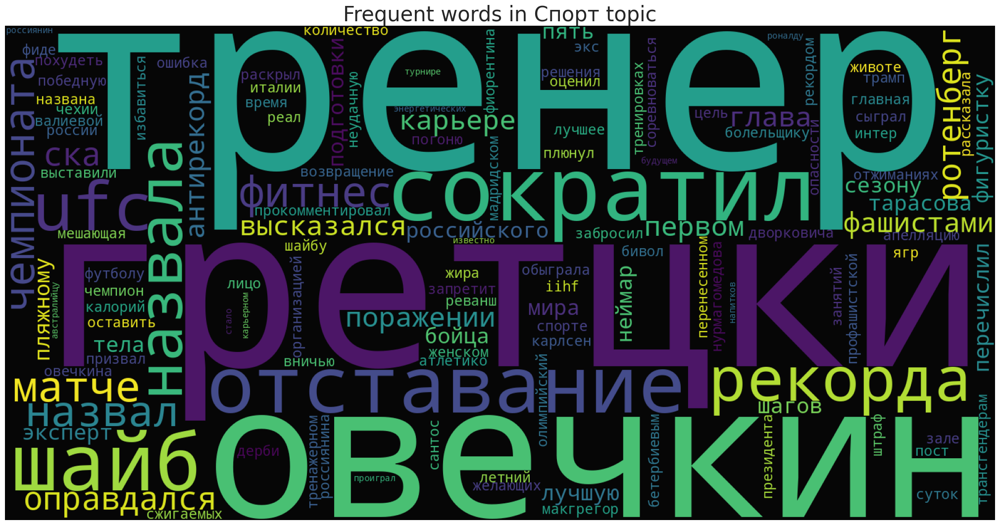

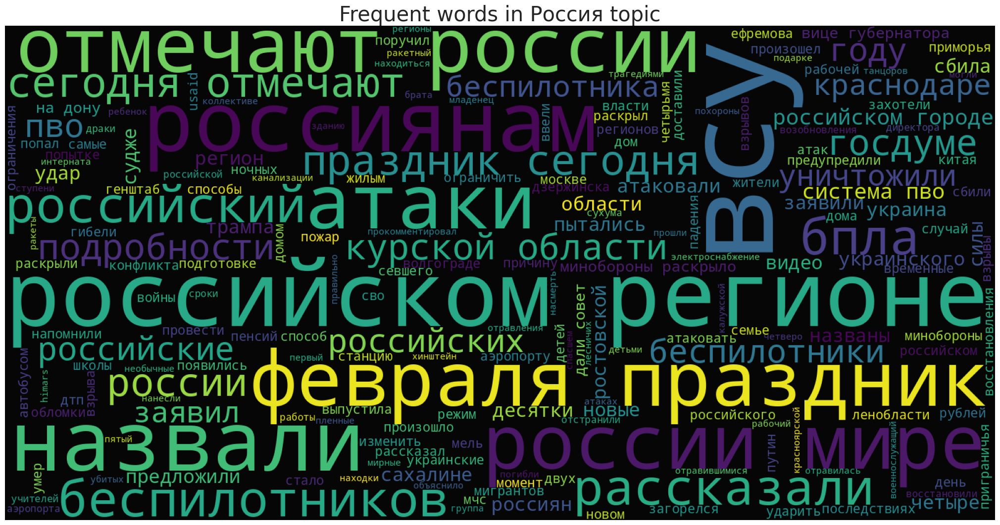

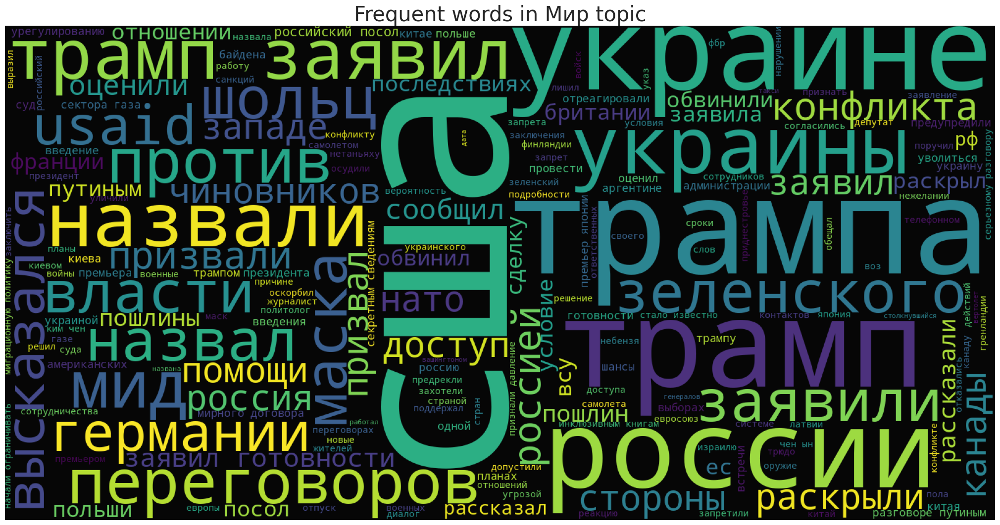

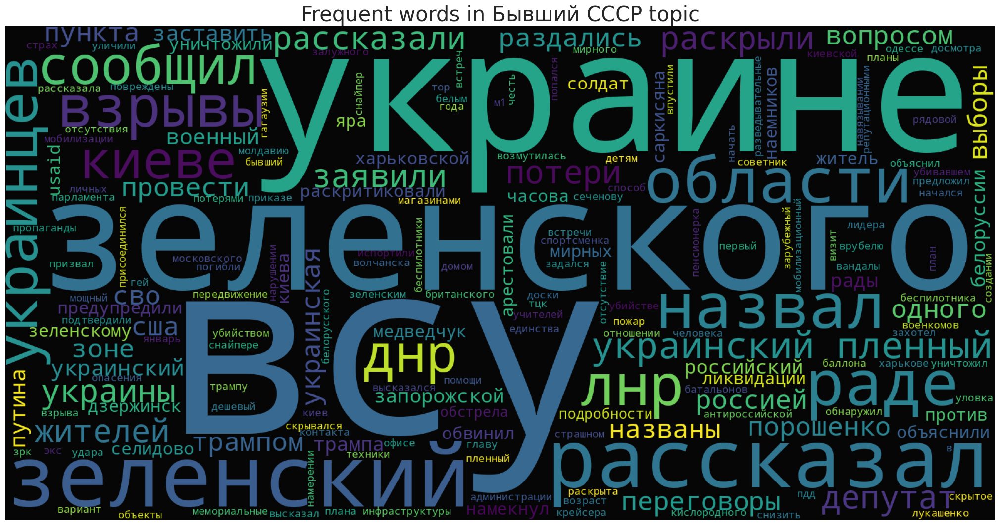

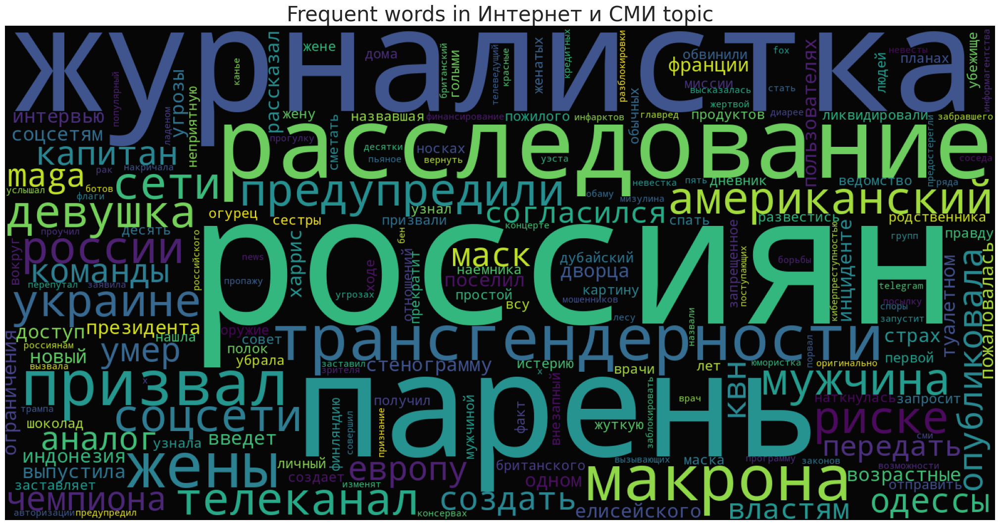

...

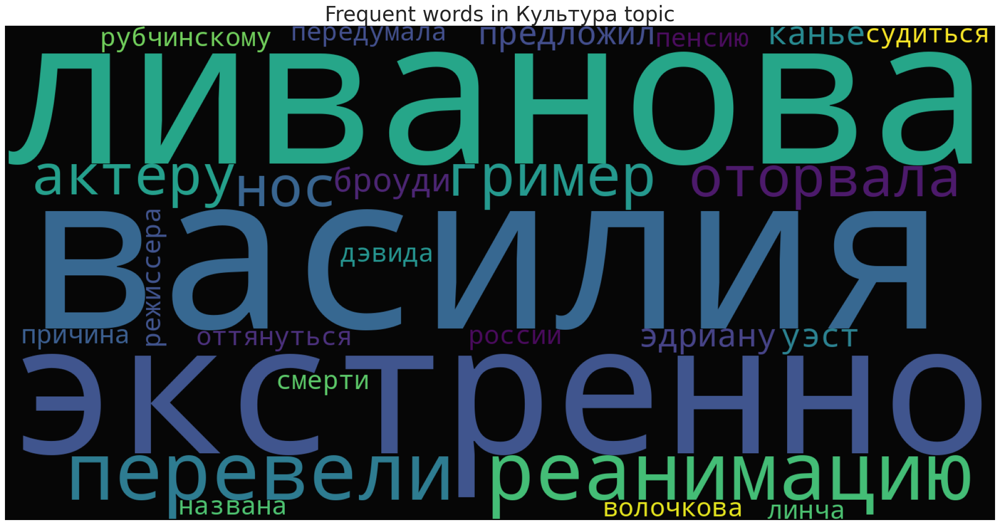

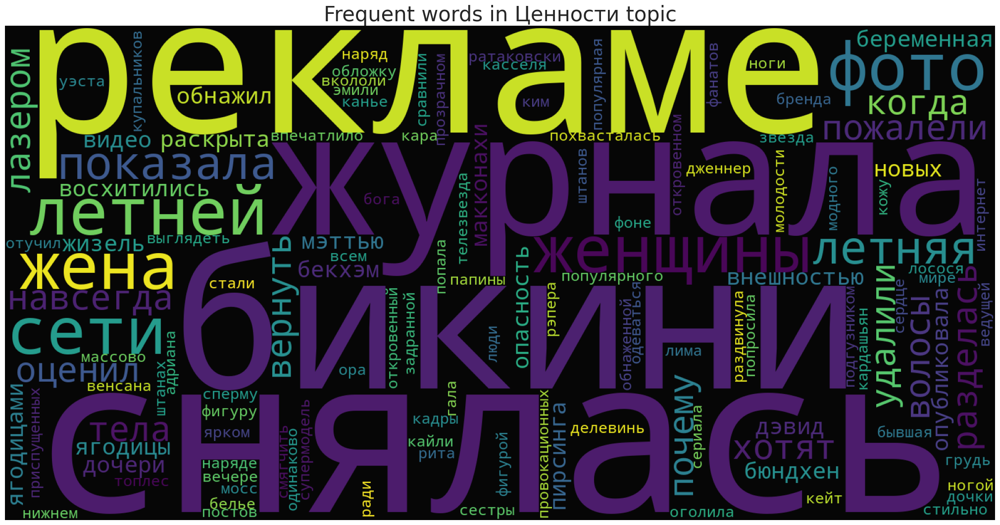

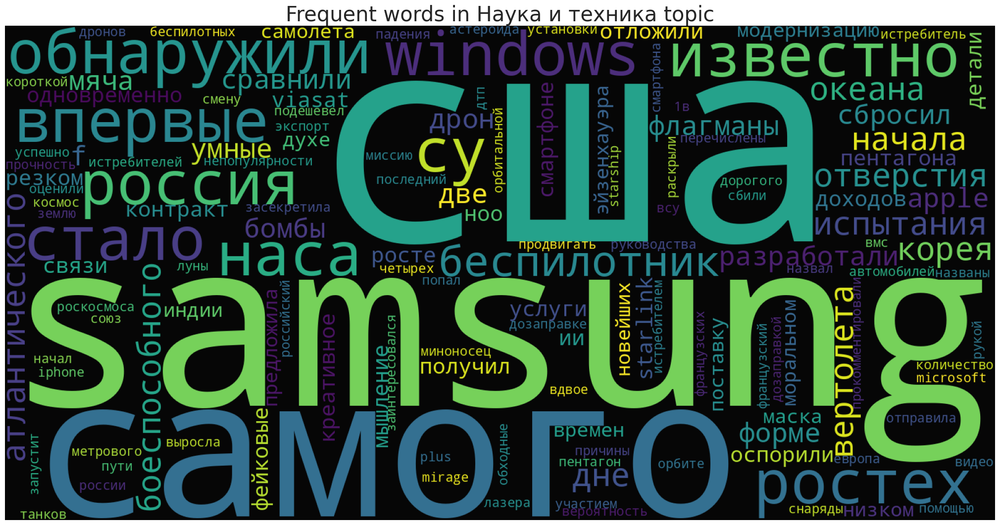

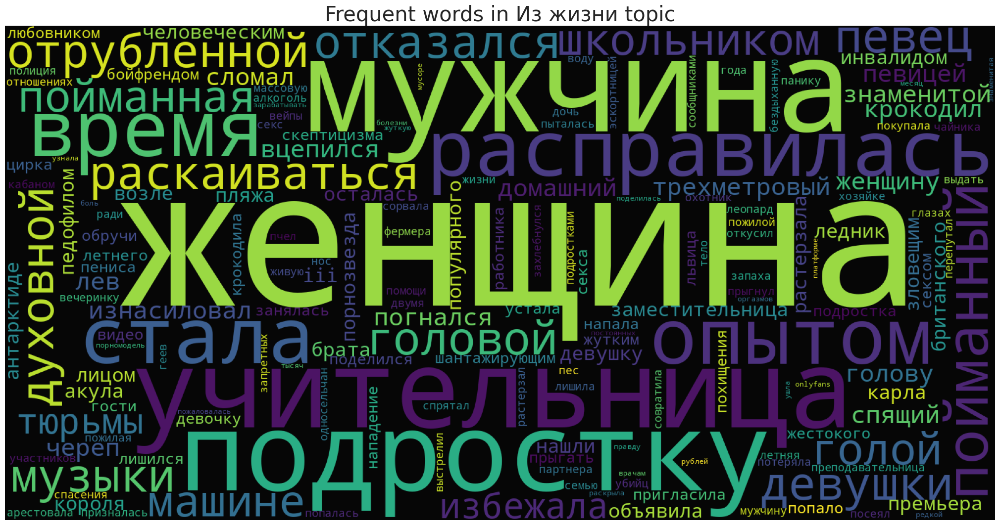

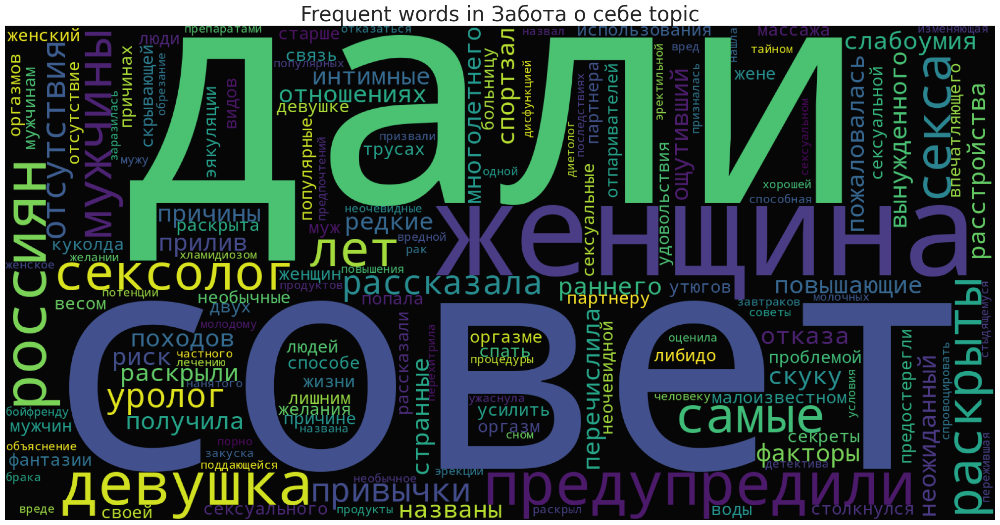

In [6]:
for tag in df.tag.unique():
    words = df[df.tag == tag].title.str.split(' ').explode().values
    words = [word.lower() for word in words if word.lower() not in stop_words]

    wc = WordCloud(background_color="black", width=1600, height=800)
    wc.generate(" ".join(words))

    fig, ax = plt.subplots(1, 1, figsize=(20, 10))
    plt.axis("off")
    plt.tight_layout(pad=0)
    ax.set_title(f"Frequent words in {tag} topic", fontsize=30)
    ax.imshow(wc, alpha=0.98)

<ipython-input-12-a389088a1d02>:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=df[col], palette='tab10', ax=axs[ind], order=df[col].value_counts(ascending=True).index)
<ipython-input-12-a389088a1d02>:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=df[col], palette='tab10', ax=axs[ind], order=df[col].value_counts(ascending=True).index)
<ipython-input-12-a389088a1d02>:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=df[col], palette='tab10', ax=axs[ind], order=df[col].value_counts(ascending=True).index)


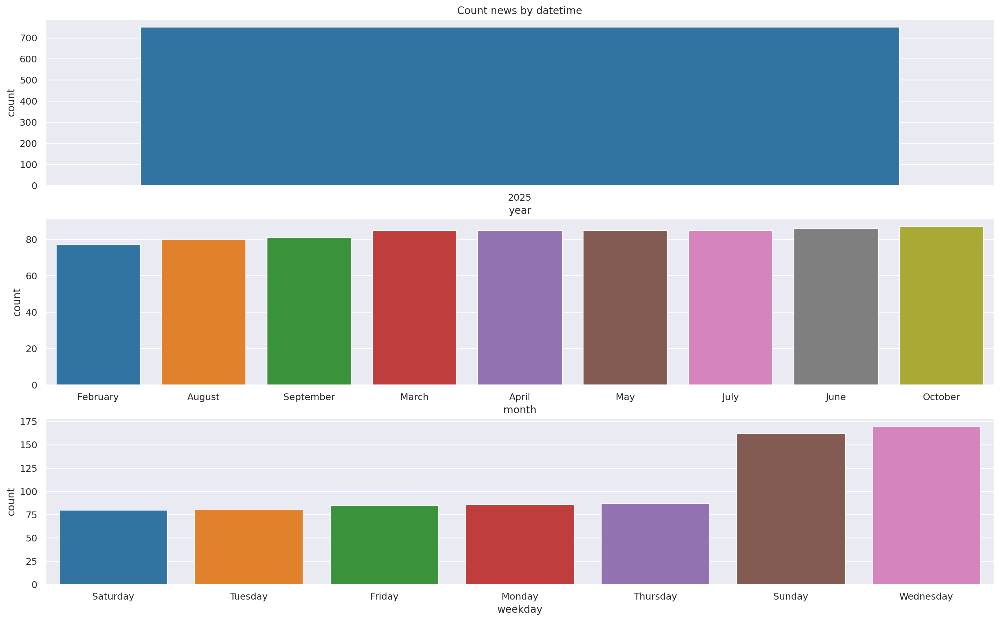

In [ ]:
fig, axs = plt.subplots(3, 1, figsize=(20, 12), dpi=200)
for ind, col in enumerate(['year', 'month', 'weekday']):
    sns.countplot(x=df[col], palette='tab10', ax=axs[ind], order=df[col].value_counts(ascending=True).index)
axs[0].set_title('Count news by datetime');


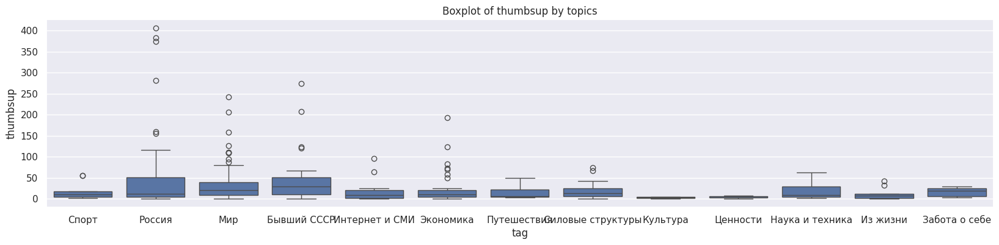

In [ ]:
fig, ax = plt.subplots(1, 1, figsize=(20, 4), dpi=100)
sns.boxplot(x="tag", y="thumbsup", data=df, ax=ax)
plt.title('усы по лайкам в разных темах');

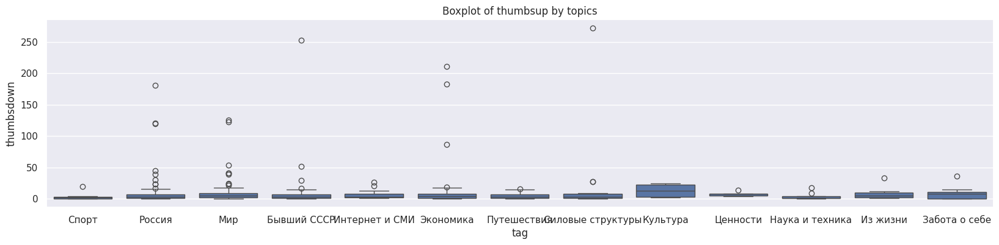

In [ ]:
fig, ax = plt.subplots(1, 1, figsize=(20, 4), dpi=100)
sns.boxplot(x="tag", y="thumbsdown", data=df, ax=ax)
plt.title('усы по дизлайкам в разных темах');